In [1]:
import sys
sys.path.append('../..') 
sys.path.append('..') 
import numpy as np
import cv2 as cv
import os
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from keras import layers
from tensorflow import keras
import gc
import matplotlib.pyplot as plt
from tools.GA.FilterGeneticAlgorithm import FilterGeneticAlgorithm
import cv2
import numpy as np

In [2]:
path = "../datasets/flowers"

items = os.listdir(path)

folder_paths = [path+"/"+item for item in items if os.path.isdir(os.path.join(path, item))]

for path in folder_paths:
    print(path)

../datasets/flowers/daisy
../datasets/flowers/dandelion
../datasets/flowers/rose
../datasets/flowers/sunflower
../datasets/flowers/tulip


In [3]:
def get_Data(folder_path,cls):
    X = []
    Y=[]
    for root, directories, files in os.walk(folder_path):
        for filename in files:
            img=cv.imread(os.path.join(root, filename))
            img=cv.cvtColor(img, cv.COLOR_RGB2BGR)
            img=cv.resize(img, (224,224))
            X.append(img)
            Y.append(cls)
    return X,Y

In [4]:
X=[]
Y=[]

for cls,folder_path in enumerate(folder_paths):
    x,y=get_Data(folder_path,cls)
    X=X+x
    Y=Y+y

In [5]:
_, X, _, Y=train_test_split(X,Y,test_size=0.3)

In [6]:
model = keras.models.Sequential([
    layers.BatchNormalization(input_shape=(224, 224, 3)),
    layers.Conv2D(16, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Conv2D(32, 3, activation='relu'),
    layers.MaxPooling2D(),
    layers.Dense(64, activation='relu'),
    layers.Flatten(),
    layers.Dense(len(folder_path), activation='softmax')
])

In [7]:
kf = KFold(n_splits=10, random_state=42, shuffle=True)
splits = list(kf.split(X))

# gaussian blur

In [8]:
def apply_gaussian_blur(image):
    blurred_image = cv.GaussianBlur(image, (5, 5), 0)
    return blurred_image

In [9]:
filtered_X = [apply_gaussian_blur(image) for image in X]

filtered_X = np.array(filtered_X)
filtered_X.shape

(1296, 224, 224, 3)

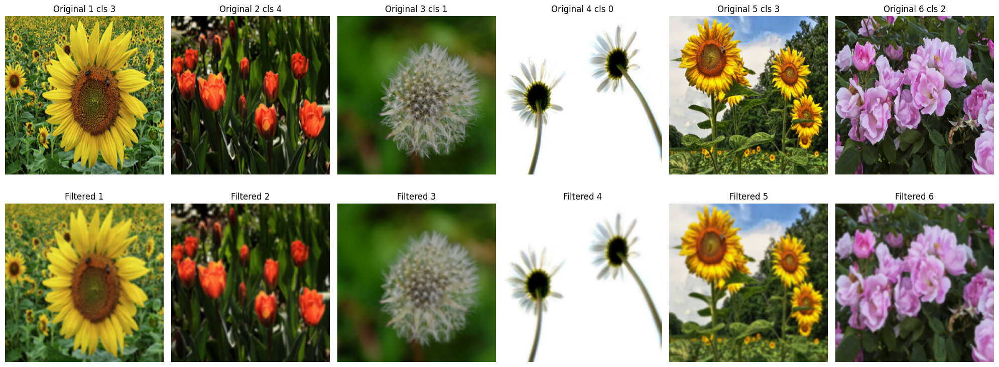

In [10]:
indices = np.random.randint(0, len(X), size=6)

fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for i, ax_col in enumerate(axes.T):
    original_index = indices[i]
    
    ax_col[0].imshow(X[original_index])
    ax_col[0].set_title(f'Original {i+1} cls {Y[original_index]}')
    ax_col[0].axis('off')
    
    ax_col[1].imshow(filtered_X[original_index])
    ax_col[1].set_title(f'Filtered {i+1}')
    ax_col[1].axis('off')

plt.tight_layout()
plt.show()

In [11]:
evaluations=0

for train_index, test_index in splits.copy():
    m= keras.models.clone_model(model)
    

    m.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

    train_index, test_index = train_index.tolist(), test_index.tolist()
    x_train, x_test, y_train, y_test = np.array(filtered_X)[train_index], np.array(filtered_X)[test_index], np.array(Y)[train_index], np.array(Y)[test_index]

    m.fit(x_train, y_train, epochs=1, batch_size=32)
    evaluations+=m.evaluate(x_test,y_test)[1]

    gc.collect()
print(evaluations/10)

5/5 [==============================] - 0s 15ms/step - loss: 1.5324 - accuracy: 0.4031
0.39823494851589203


# Median Blur

In [12]:
def apply_median_blur(image):
    blurred_image = cv.medianBlur(image, 5) 
    return blurred_image

In [13]:
filtered_X = [apply_median_blur(image) for image in X]

filtered_X = np.array(filtered_X)
filtered_X.shape

(1296, 224, 224, 3)

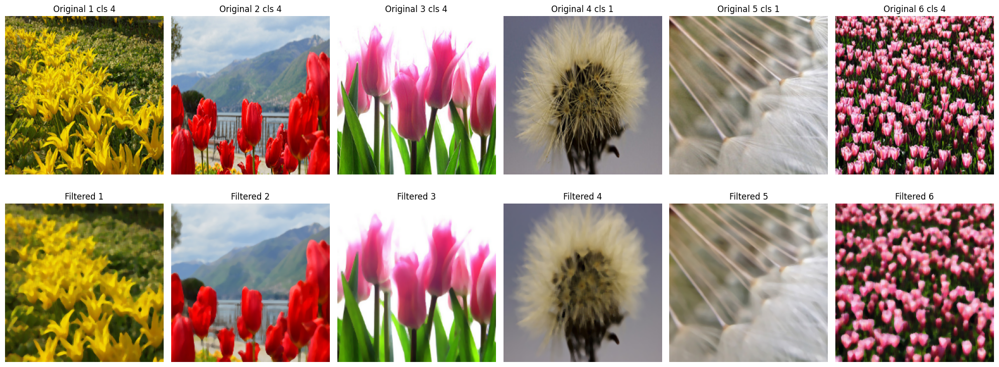

In [14]:
indices = np.random.randint(0, len(X), size=6)

fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for i, ax_col in enumerate(axes.T):
    original_index = indices[i]
    
    ax_col[0].imshow(X[original_index])
    ax_col[0].set_title(f'Original {i+1} cls {Y[original_index]}')
    ax_col[0].axis('off')
    
    ax_col[1].imshow(filtered_X[original_index])
    ax_col[1].set_title(f'Filtered {i+1}')
    ax_col[1].axis('off')

plt.tight_layout()
plt.show()

In [15]:
evaluations=0

for train_index, test_index in splits.copy():
    m= keras.models.clone_model(model)
    

    m.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

    train_index, test_index = train_index.tolist(), test_index.tolist()
    x_train, x_test, y_train, y_test = np.array(filtered_X)[train_index], np.array(filtered_X)[test_index], np.array(Y)[train_index], np.array(Y)[test_index]

    m.fit(x_train, y_train, epochs=1, batch_size=32)
    evaluations+=m.evaluate(x_test,y_test)[1]

    gc.collect()
print(evaluations/10)

5/5 [==============================] - 0s 15ms/step - loss: 2.0410 - accuracy: 0.4341
0.4368097871541977


# Laplacian Filter

In [16]:
def apply_laplacian_filter(image):
    laplacian_image = cv.Laplacian(image, cv.CV_64F)
    laplacian_image = np.uint8(np.absolute(laplacian_image))
    return laplacian_image

In [17]:
filtered_X = [apply_laplacian_filter(image) for image in X]

filtered_X = np.array(filtered_X)
filtered_X.shape

(1296, 224, 224, 3)

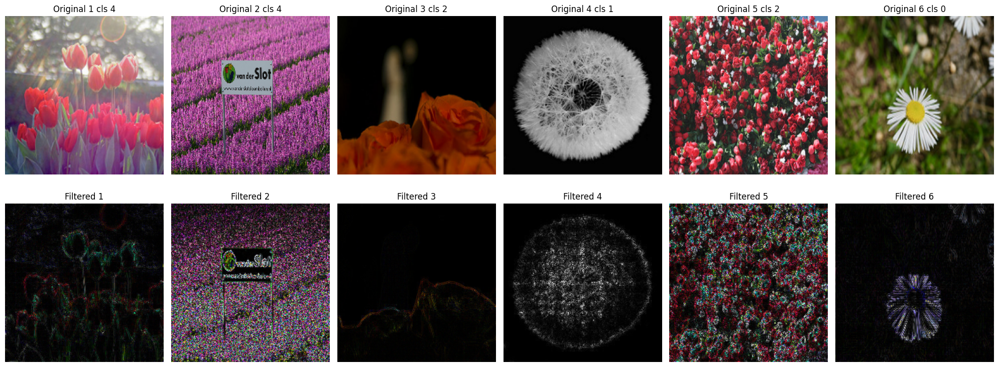

In [18]:
indices = np.random.randint(0, len(X), size=6)

fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for i, ax_col in enumerate(axes.T):
    original_index = indices[i]
    
    ax_col[0].imshow(X[original_index])
    ax_col[0].set_title(f'Original {i+1} cls {Y[original_index]}')
    ax_col[0].axis('off')
    
    ax_col[1].imshow(filtered_X[original_index])
    ax_col[1].set_title(f'Filtered {i+1}')
    ax_col[1].axis('off')

plt.tight_layout()
plt.show()

In [19]:
evaluations=0

for train_index, test_index in splits.copy():
    m= keras.models.clone_model(model)
    

    m.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

    train_index, test_index = train_index.tolist(), test_index.tolist()
    x_train, x_test, y_train, y_test = np.array(filtered_X)[train_index], np.array(filtered_X)[test_index], np.array(Y)[train_index], np.array(Y)[test_index]

    m.fit(x_train, y_train, epochs=1, batch_size=32)
    evaluations+=m.evaluate(x_test,y_test)[1]

    gc.collect()
print(evaluations/10)

5/5 [==============================] - 0s 15ms/step - loss: 1.7367 - accuracy: 0.3256
0.35652952194213866


# unsharp mask

In [20]:
def apply_unsharp_mask(image):
    blurred = cv.GaussianBlur(image, (5, 5), 0)
    
    unsharp_mask = cv.addWeighted(image, 2, blurred, -1, 0)
    
    unsharp_mask = np.clip(unsharp_mask, 0, 255).astype(np.uint8)
    
    return unsharp_mask

In [21]:
filtered_X = [apply_unsharp_mask(image) for image in X]

filtered_X = np.array(filtered_X)
filtered_X.shape

(1296, 224, 224, 3)

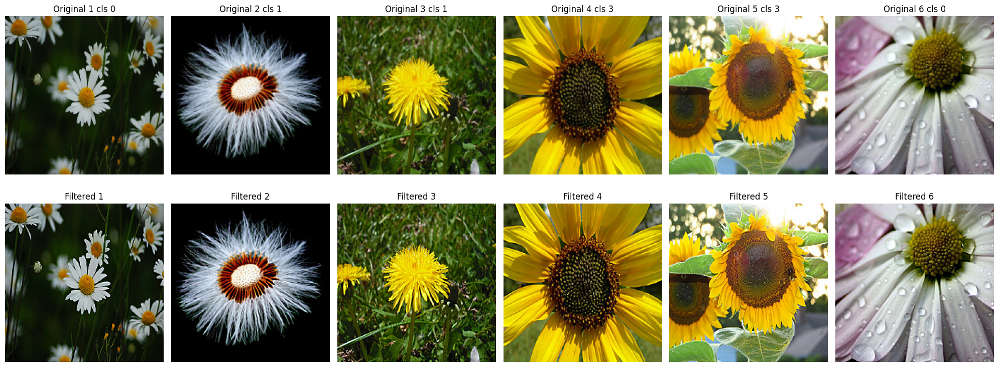

In [22]:
indices = np.random.randint(0, len(X), size=6)

fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for i, ax_col in enumerate(axes.T):
    original_index = indices[i]
    
    ax_col[0].imshow(X[original_index])
    ax_col[0].set_title(f'Original {i+1} cls {Y[original_index]}')
    ax_col[0].axis('off')
    
    ax_col[1].imshow(filtered_X[original_index])
    ax_col[1].set_title(f'Filtered {i+1}')
    ax_col[1].axis('off')

plt.tight_layout()
plt.show()

In [23]:
evaluations=0

for train_index, test_index in splits.copy():
    m= keras.models.clone_model(model)
    

    m.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

    train_index, test_index = train_index.tolist(), test_index.tolist()
    x_train, x_test, y_train, y_test = np.array(filtered_X)[train_index], np.array(filtered_X)[test_index], np.array(Y)[train_index], np.array(Y)[test_index]

    m.fit(x_train, y_train, epochs=1, batch_size=32)
    evaluations+=m.evaluate(x_test,y_test)[1]

    gc.collect()
print(evaluations/10)

5/5 [==============================] - 0s 15ms/step - loss: 1.3727 - accuracy: 0.4031
0.41129398047924043


# Bilateral Filter

In [24]:
def apply_bilateral_filter(image):
    filtered_image = cv.bilateralFilter(image, d=9, sigmaColor=75, sigmaSpace=75)
    return filtered_image

In [25]:
filtered_X = [apply_bilateral_filter(image) for image in X]

filtered_X = np.array(filtered_X)
filtered_X.shape

(1296, 224, 224, 3)

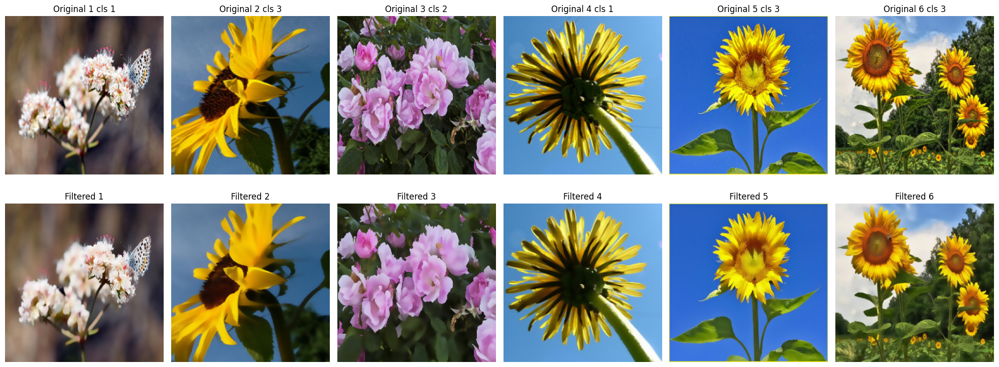

In [26]:
indices = np.random.randint(0, len(X), size=6)

fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for i, ax_col in enumerate(axes.T):
    original_index = indices[i]
    
    ax_col[0].imshow(X[original_index])
    ax_col[0].set_title(f'Original {i+1} cls {Y[original_index]}')
    ax_col[0].axis('off')
    
    ax_col[1].imshow(filtered_X[original_index])
    ax_col[1].set_title(f'Filtered {i+1}')
    ax_col[1].axis('off')

plt.tight_layout()
plt.show()

In [27]:
evaluations=0

for train_index, test_index in splits.copy():
    m= keras.models.clone_model(model)
    

    m.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

    train_index, test_index = train_index.tolist(), test_index.tolist()
    x_train, x_test, y_train, y_test = np.array(filtered_X)[train_index], np.array(filtered_X)[test_index], np.array(Y)[train_index], np.array(Y)[test_index]

    m.fit(x_train, y_train, epochs=1, batch_size=32)
    evaluations+=m.evaluate(x_test,y_test)[1]

    gc.collect()
print(evaluations/10)

5/5 [==============================] - 0s 14ms/step - loss: 1.2760 - accuracy: 0.4884
0.4144364967942238


# hog feature extraction

In [28]:
from skimage.feature import hog
from skimage import exposure

def apply_hog_feature_extraction(image):

    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    _, hog_image = hog(gray_image, orientations=9, pixels_per_cell=(8, 8),
                              cells_per_block=(2, 2), visualize=True, block_norm='L2-Hys')
    
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
    
    return np.array(hog_image_rescaled)

In [29]:
filtered_X = np.array([apply_hog_feature_extraction(image) for image in X])

In [30]:
filtered_X.shape

(1296, 224, 224)

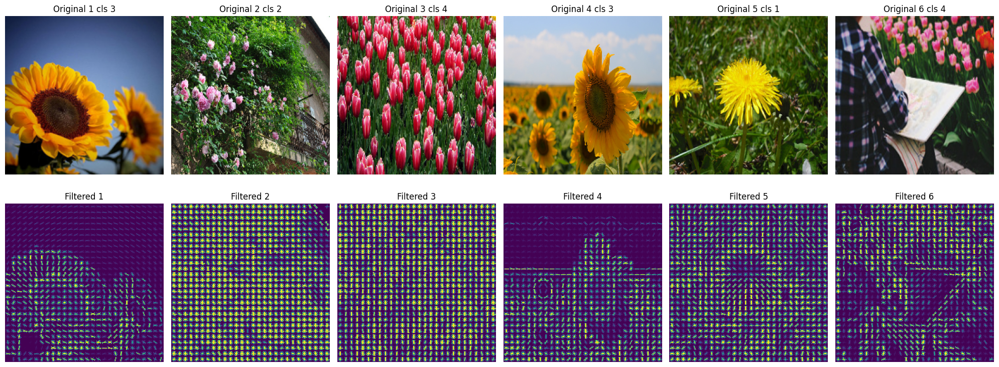

In [31]:
indices = np.random.randint(0, len(X), size=6)

fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for i, ax_col in enumerate(axes.T):
    original_index = indices[i]
    
    ax_col[0].imshow(X[original_index])
    ax_col[0].set_title(f'Original {i+1} cls {Y[original_index]}')
    ax_col[0].axis('off')
    
    ax_col[1].imshow(filtered_X[original_index])
    ax_col[1].set_title(f'Filtered {i+1}')
    ax_col[1].axis('off')

plt.tight_layout()
plt.show()


In [32]:
model = keras.models.clone_model(model, input_tensors= layers.Input((filtered_X.shape[1], filtered_X.shape[2], 1)))

In [33]:
evaluations=0

for train_index, test_index in splits.copy():
    m= keras.models.clone_model(model)
    

    m.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

    train_index, test_index = train_index.tolist(), test_index.tolist()
    x_train, x_test, y_train, y_test = np.array(filtered_X)[train_index], np.array(filtered_X)[test_index], np.array(Y)[train_index], np.array(Y)[test_index]

    m.fit(x_train, y_train, epochs=1, batch_size=32)
    evaluations+=m.evaluate(x_test,y_test)[1]

    gc.collect()
print(evaluations/10)

5/5 [==============================] - 0s 16ms/step - loss: 2.1311 - accuracy: 0.2946
0.3440906435251236


# LBP

In [34]:
from skimage.feature import local_binary_pattern

def apply_LBP(X):
    X_lbp = []
    for img in X:
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        elif len(img.shape) == 2:
            gray = img
        else:
            raise ValueError("Unsupported image format")

        radius = 3
        n_points = 8 * radius
        lbp = local_binary_pattern(gray, n_points, radius, method='uniform')
        
        X_lbp.append(lbp.flatten())
        
    return np.array(X_lbp)

In [35]:
filtered_X = np.array([apply_LBP(image) for image in X])
filtered_X.shape

(1296, 224, 672)

In [36]:
model = keras.models.clone_model(model, input_tensors= layers.Input((filtered_X.shape[1], filtered_X.shape[2], 1)))

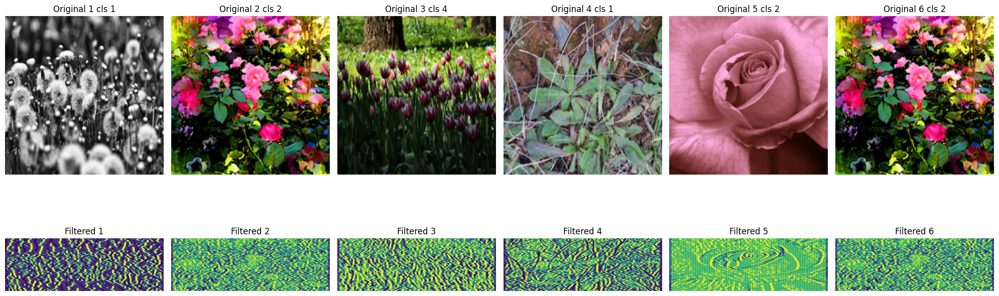

In [37]:
indices = np.random.randint(0, len(X), size=6)

fig, axes = plt.subplots(2, 6, figsize=(20, 8))

for i, ax_col in enumerate(axes.T):
    original_index = indices[i]
    
    ax_col[0].imshow(X[original_index])
    ax_col[0].set_title(f'Original {i+1} cls {Y[original_index]}')
    ax_col[0].axis('off')
    
    ax_col[1].imshow(filtered_X[original_index])
    ax_col[1].set_title(f'Filtered {i+1}')
    ax_col[1].axis('off')

plt.tight_layout()
plt.show()


In [38]:
evaluations=0

for train_index, test_index in splits.copy():
    m= keras.models.clone_model(model)
    
    m.layers[0].batch_input_shape = (None, 224, 224, 1)

    m.compile(optimizer="adam", loss=keras.losses.SparseCategoricalCrossentropy(), metrics=['accuracy'])

    train_index, test_index = train_index.tolist(), test_index.tolist()
    x_train, x_test, y_train, y_test = np.array(filtered_X)[train_index], np.array(filtered_X)[test_index], np.array(Y)[train_index], np.array(Y)[test_index]

    m.fit(x_train, y_train, epochs=1, batch_size=32)
    evaluations+=m.evaluate(x_test,y_test)[1]

    gc.collect()
print(evaluations/10)

5/5 [==============================] - 0s 42ms/step - loss: 2.2576 - accuracy: 0.1628
0.26911747753620147
